
<p align="center">
<FONT FACE="times new roman" SIZE=5>
<br>
<i><b>Docente:</b> Darwin Martinez.</i>
<br>
<i><b>Asignatura:</b> Procesamiento de Imagenes</i>
<br>
<i><b>Autores:</b> <br>Carlos Bermudez, Miguel Thomas</i>
<br>
<i><b>Grupo:</b> <br>DarthBane</i>
<br>
<i><b>Tema:</b> Color</i>
<br>
<i>27/05/24</i>
</FONT>
</p>



In [463]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Imagen de ambiente natural

## 1. Cargue la imagen y descríbala

Dimensiones: (633, 567, 3)


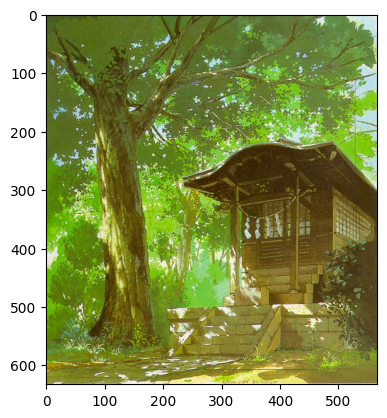

In [464]:
img_naturaleza = cv2.imread('naturaleza.jpg')
img_naturaleza = cv2.cvtColor(img_naturaleza,cv2.COLOR_BGR2RGB)
print(f'Dimensiones: {img_naturaleza.shape}')
plt.imshow(img_naturaleza)

__DESCRIPCIÓN DE LA IMAGEN:__
La imagen posee dimensiones de 633 píxeles de ancho por 567 píxeles de alto, con una profundidad de color de 3 canales. Esta representa un entorno natural que incluye un robusto árbol y una casa como sus elementos principales. La iluminación presente en la imagen se caracteriza por tonalidades cálidas.


## 2. Cambie el modelo de color de la imagen a HSI

In [465]:
def show_channels_image(img,fig_title='',C1_title='1',C2_title='2',C3_title='3',cmap='gray'):
    """
    Descripcion: 
        - Descompone la imagen en sus colores principales y muestra los caneles en una figura de Matplotlib con sus titulos.
        
    Parametros:     
        - img: Imagen en RGB.
        - fig_title: Titulo de la figura.
        - C1_title: Titulo del primer canal.
        - C2_title: Titulo del segundo canal.
        - C3_title: Titulo del tercer canal.
        
    Retorno: 
        - None
    """
    canal_1= img[:, :, 0]
    canal_2 = img[:, :, 1]
    canal_3 = img[:, :, 2]
    
    fig, ax = plt.subplots(1,3 ,figsize= (15,5))

    ax[0].imshow(canal_1, cmap=cmap)
    ax[0].set_title(f'Canal:  {C1_title}')
    ax[1].imshow(canal_2, cmap=cmap)
    ax[1].set_title(f'Canal:  {C2_title}')
    ax[2].imshow(canal_3, cmap=cmap)
    ax[2].set_title(f'Canal:  {C3_title}')
    
    # Agregar un título general a la figura
    fig.suptitle(fig_title, fontsize=20)

    plt.show()
    

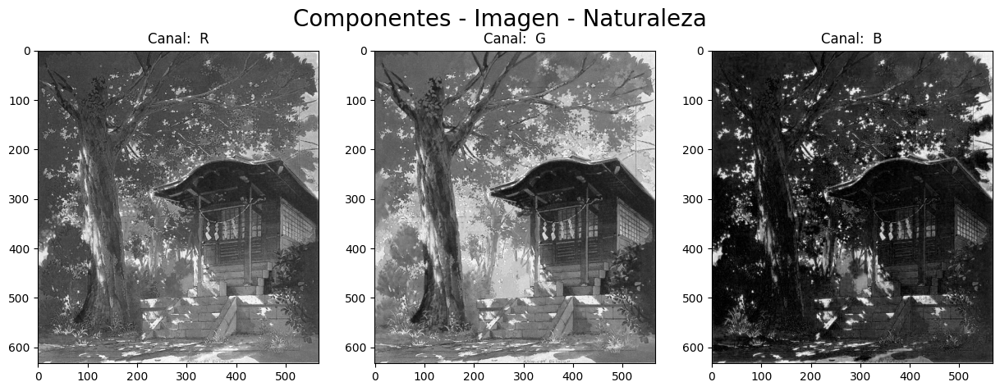

In [466]:
#print(np.unique(img_naturaleza[:,:,0]))
show_channels_image(img_naturaleza, 'Componentes - Imagen - Naturaleza','R','G','B')

__Convertimos la imagen RGB a HSI:__

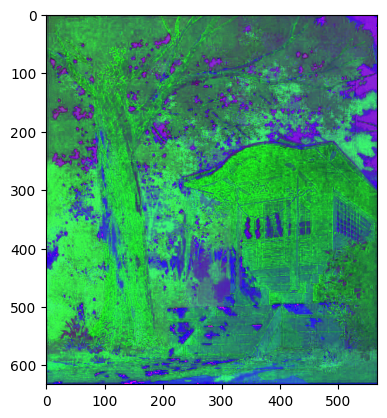

In [467]:
def convert_RGB_to_HSI(image):
    """
    Descripcion: 
        - Descompone la imagen RGB para sacar los componentes H - S - I y pasar la imagen a HSI.
        
    Parametros: 
        - image: Imagen en RGB.
        
    Retorno: 
        - HSI: Imagen en modelo HSI.
    """
    # Asegurarse de que la imagen está en formato float y normalizada
    image = image.astype(np.float32) / 255.0
    
    # Separar los canales de la imagen
    R, G, B = image[:,:,0], image[:,:,1], image[:,:,2]
    
    # Calcular la Intensidad
    I = (R + G + B) / 3.0
    
    # Calcular la Saturación
    min_RGB = np.minimum(np.minimum(R, G), B)
    S = 1 - (3 / (R + G + B + 1e-6)) * min_RGB  # Añadir un pequeño valor para evitar división por cero
    
    # Calcular la Tonalidad
    num = 0.5 * ((R - G) + (R - B))
    denom = np.sqrt((R - G) ** 2 + (R - B) * (G - B))
    theta = np.arccos(num / (denom + 1e-6))  # Añadir un pequeño valor para evitar división por cero

    H = np.where(B <= G, theta, 2 * np.pi - theta)
    H = H / (2 * np.pi)  # Normalizar H a [0, 1]
    
    # Combinar los canales H, S, I en una sola imagen
    HSI = np.stack((H, S, I), axis=-1)
    return HSI


img_HSI = convert_RGB_to_HSI(img_naturaleza)

plt.imshow(img_HSI)


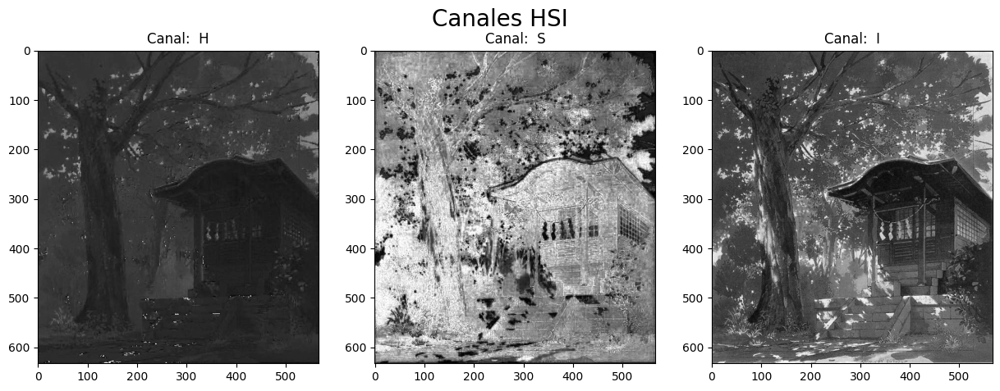

In [468]:
show_channels_image(img_HSI,'Canales HSI','H','S','I')

## 3. Aplique al canal de intensidad una Equalización.

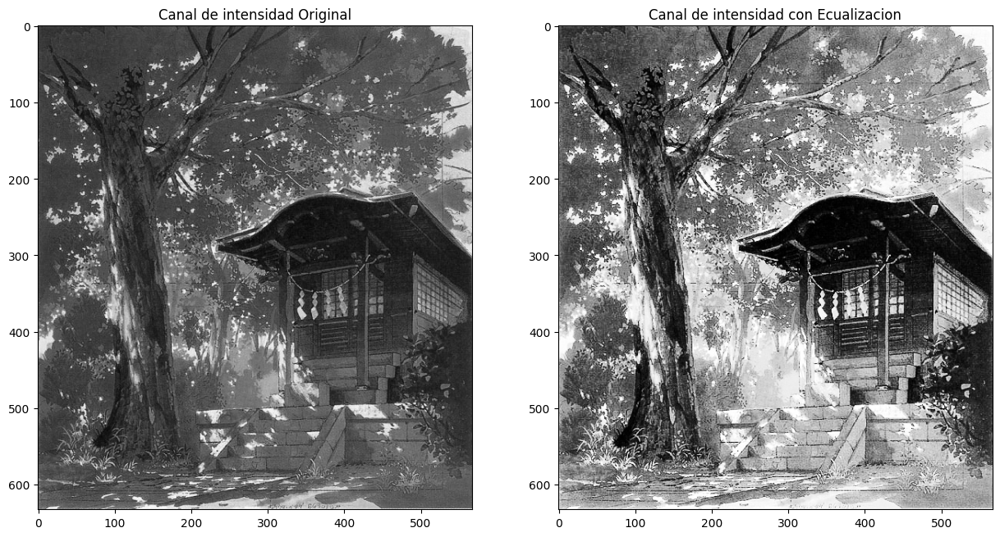

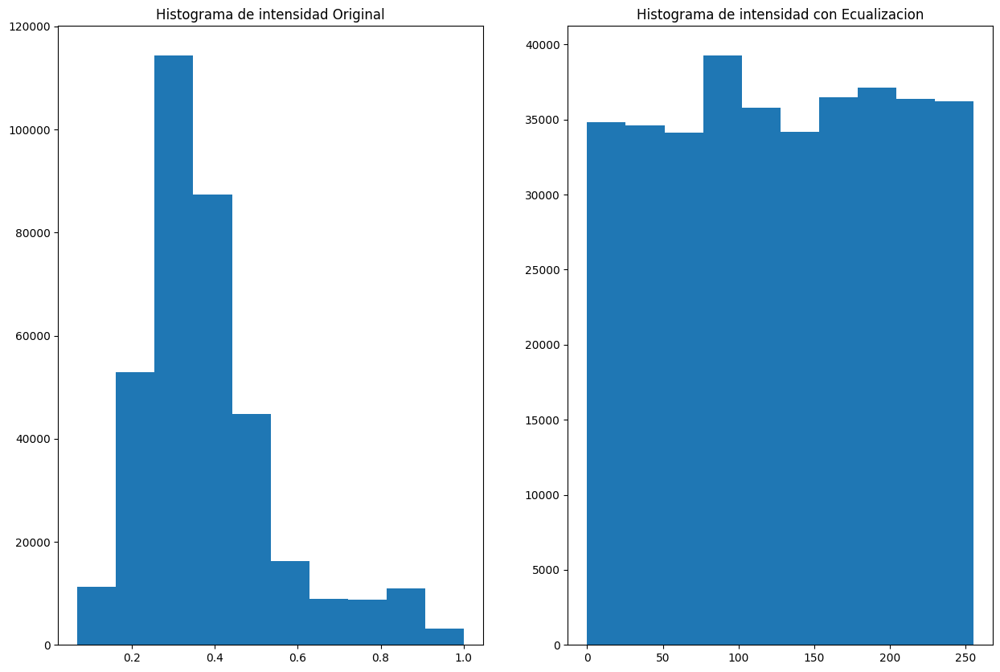

In [469]:
canal_I = img_HSI[:,:,2].copy()
canal_i_ecual = cv2.equalizeHist((canal_I*255).astype(np.uint8))
#img_HSI[:,:,2] = canal_i_ecual

fig, ax = plt.subplots(1,2,figsize=(15,10))

ax[0].set_title('Canal de intensidad Original')
ax[0].imshow(canal_I,cmap='gray')
ax[1].set_title('Canal de intensidad con Ecualizacion')
ax[1].imshow(canal_i_ecual,cmap = 'gray')
plt.show()

fig, ax = plt.subplots(1,2,figsize=(15,10))

ax[0].set_title('Histograma de intensidad Original')
ax[0].hist(canal_I.reshape(-1,1))
ax[1].set_title('Histograma de intensidad con Ecualizacion')
ax[1].hist(canal_i_ecual.reshape(-1,1))
plt.show()

## 4. Aplique un filtro (Función monotónica creciente) al canal de Tonalidad y otro al canal de Saturación

In [470]:
def apply_monotonic_increasing_function(channel, focus_range=None):
    
    '''
    Descripcion: 
        - Recibe el canal y le aplica la funcion monotonica creciente
    
    Parametros:
        - channel: canal de la imagen
        - focus_range: Intervalos de valores que se van a resaltar
        
    Retorno: 
        - channel: canal con la funcion aplicada
    '''

    if focus_range is not None:
        mask = (channel >= focus_range[0]) & (channel <= focus_range[1])
        channel[mask] = np.interp(channel[mask], (focus_range[0], focus_range[1]), (0.5, 1.0))
    channel = np.interp(channel, (channel.min(), channel.max()), (0, 1))
    return channel



In [471]:
img_HSI_modificada = img_HSI.copy()
focus_range_hue = (90 / 360, 150 / 360) #Para resaltar los verdes y azules muy claros
focus_range_s = (0.1,0,2)
img_HSI_modificada[:,:,0] = apply_monotonic_increasing_function(img_HSI_modificada[:,:,0],focus_range_hue)
img_HSI_modificada[:,:,1] = apply_monotonic_increasing_function(img_HSI_modificada[:,:,1],focus_range_s)
img_HSI_modificada[:,:,2] = canal_i_ecual / 255

## 5. Viualize la imagen obtenida con cada cambio de canal de manera independiente, es decir con el cambio en el canal de intensidad, con el cambio en la tonalidad y con el cambio en la saturación

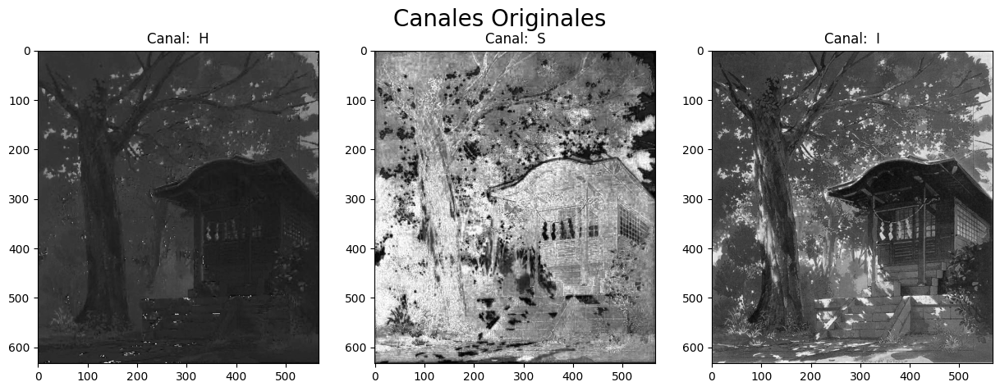

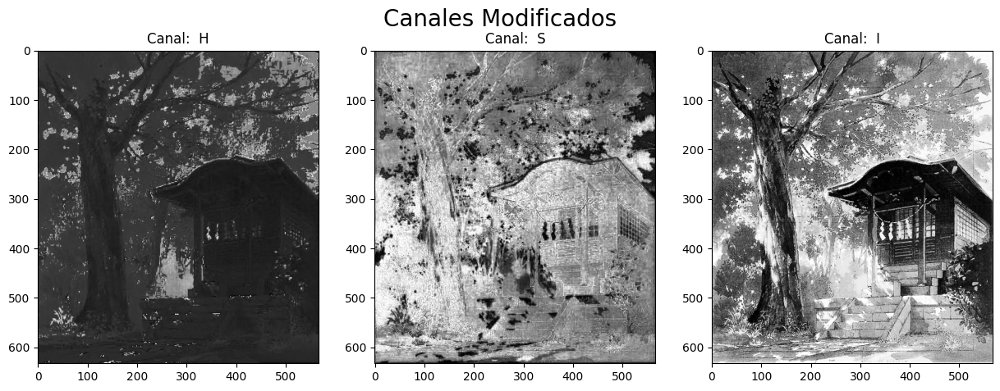

In [472]:
show_channels_image(img_HSI,'Canales Originales', 'H','S','I')
show_channels_image(img_HSI_modificada, 'Canales Modificados','H','S','I')


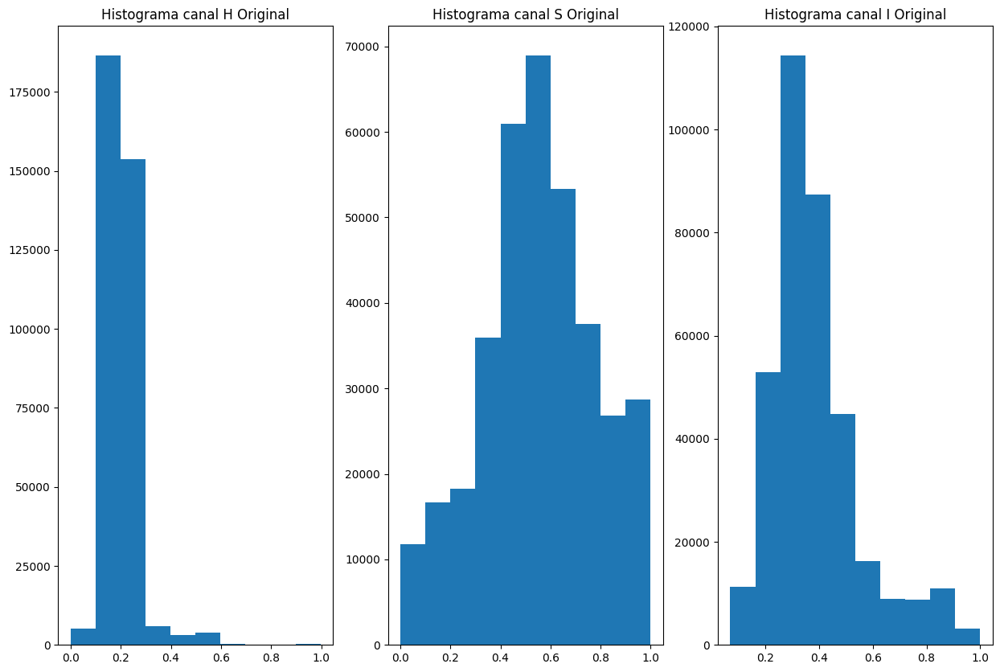

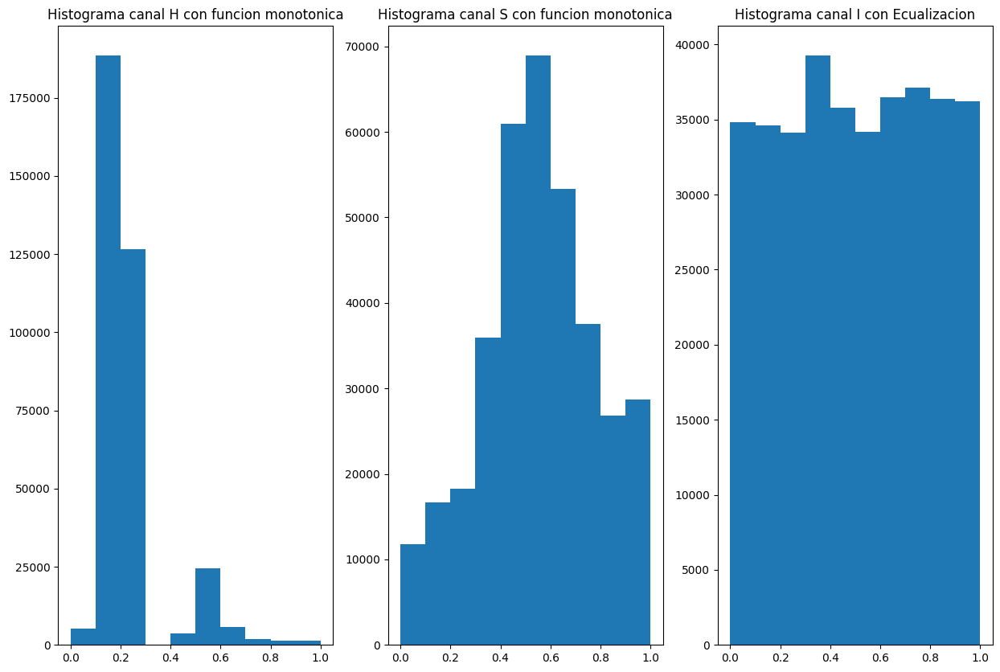

In [473]:

fig, ax = plt.subplots(1,3,figsize=(15,10))

ax[0].set_title('Histograma canal H Original')
ax[0].hist(img_HSI[:,:,0].reshape(-1,1))
ax[1].set_title('Histograma canal S Original')
ax[1].hist(img_HSI[:,:,1].reshape(-1,1))
ax[2].set_title('Histograma canal I Original')
ax[2].hist(img_HSI[:,:,2].reshape(-1,1))
plt.show()

fig, ax = plt.subplots(1,3,figsize=(15,10))

ax[0].set_title('Histograma canal H con funcion monotonica')
ax[0].hist(img_HSI_modificada[:,:,0].reshape(-1,1))
ax[1].set_title('Histograma canal S con funcion monotonica')
ax[1].hist(img_HSI_modificada[:,:,1].reshape(-1,1))
ax[2].set_title('Histograma canal I con Ecualizacion')
ax[2].hist(img_HSI_modificada[:,:,2].reshape(-1,1))
plt.show()

## 6. Rearme la imagen con los canales transformados y visualízela

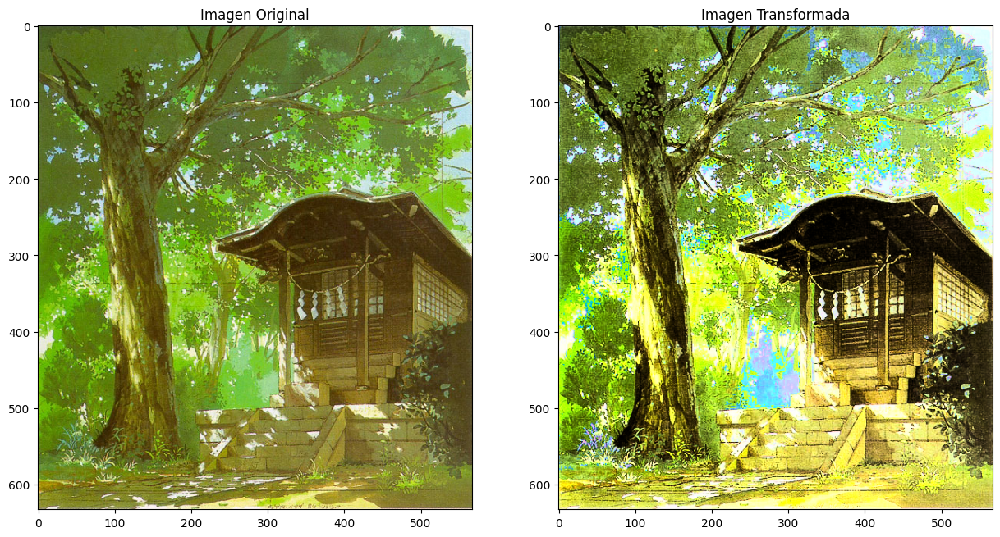

In [474]:
def convert_HSI_to_RGB(img_HSI):
    H = img_HSI[:, :, 0] * 2 * np.pi
    S = img_HSI[:, :, 1]
    I = img_HSI[:, :, 2]
        
    R = np.zeros_like(H)
    G = np.zeros_like(H)
    B = np.zeros_like(H)
    
    # Sector 1: 0 <= H < 2*pi/3
    idx = (0 <= H) & (H < 2 * np.pi / 3)
    B[idx] = I[idx] * (1 - S[idx])
    R[idx] = I[idx] * (1 + S[idx] * np.cos(H[idx]) / np.cos(np.pi / 3 - H[idx]))
    G[idx] = 3 * I[idx] - (R[idx] + B[idx])
    
    # Sector 2: 2*pi/3 <= H < 4*pi/3
    idx = (2 * np.pi / 3 <= H) & (H < 4 * np.pi / 3)
    H[idx] = H[idx] - 2 * np.pi / 3
    R[idx] = I[idx] * (1 - S[idx])
    G[idx] = I[idx] * (1 + S[idx] * np.cos(H[idx]) / np.cos(np.pi / 3 - H[idx]))
    B[idx] = 3 * I[idx] - (R[idx] + G[idx])
    
    # Sector 3: 4*pi/3 <= H < 2*pi
    idx = (4 * np.pi / 3 <= H) & (H < 2 * np.pi)
    H[idx] = H[idx] - 4 * np.pi / 3
    G[idx] = I[idx] * (1 - S[idx])
    B[idx] = I[idx] * (1 + S[idx] * np.cos(H[idx]) / np.cos(np.pi / 3 - H[idx]))
    R[idx] = 3 * I[idx] - (G[idx] + B[idx])
    
    img_RGB = np.stack((R, G, B), axis=2)
    img_RGB = np.clip(img_RGB, 0, 1)
    return (img_RGB * 255).astype(np.uint8)

imagen_armada = convert_HSI_to_RGB(img_HSI_modificada)

fig, ax = plt.subplots(1,2,figsize=(15,10))

ax[0].set_title('Imagen Original')
ax[0].imshow(img_naturaleza,cmap='gray')
ax[1].set_title('Imagen Transformada')
ax[1].imshow(imagen_armada,cmap = 'gray')
plt.show()

## 7. Describa con detalle los resultados obtenidos en contraste con la imagen original

* Mejoras Observadas:

    - __Mayor Visibilidad:__ Los detalles que eran menos visibles en la imagen original ahora son más claros. Esto es especialmente útil para ver texturas y pequeñas características de la imagen.
    - __Contraste Mejorado:__ La imagen transformada tiene un mejor contraste, lo que hace que los objetos se destaquen más.
    - __Colores Vibrantes:__ Los colores son más intensos y definidos, lo que puede hacer que la imagen sea más atractiva visualmente.

* Desventajas: 
    - __Artefactos de Color:__ La ecualización y la aplicación de las funciones monotónicas crecientes pueden introducir algunos artefactos de color, como tonos que no estaban presentes en la imagen original, por ejemplo los tonos azulados que no estaban presentes en la imagen original.
    - __Pérdida de Naturalidad:__ La imagen transformada puede perder parte de su apariencia natural debido al aumento de brillo, contraste y cambios en la tonalidad y saturación.

# Imagen de ilustración

## 1. Cargue la imagen y describala

Dimensiones: (1238, 880, 3)


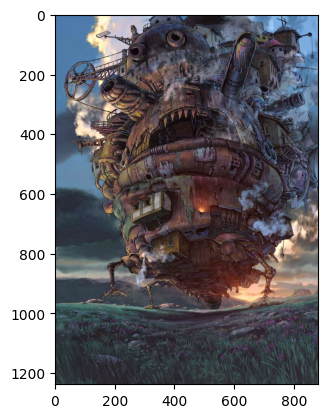

In [475]:
img_ilustracion = cv2.imread('ilustracion.jpg')
img_ilustracion = cv2.cvtColor(img_ilustracion, cv2.COLOR_BGR2RGB)
print(f'Dimensiones: {img_ilustracion.shape}')
plt.imshow(img_ilustracion)


__Descripción de la imagen:__

## 2. Explore los diferentes canales en el modelo de color RGB, CMYK y HSI, es decir visualize cada canal

In [476]:
def convert_RGB_to_CMYK(image):
    """
    Descripcion: 
        - Descompone la imagen RGB para sacar los componentes C - M - Y, luego calcula el componente K y transforma la imagen RGB a CMYK.
        
    Parametros: 
        - image: Imagen en RGB.
        
    Retorno: 
        - cmyk_image: Imagen en modelo CMYK.
    """
    
    # Normalizar los valores de los píxeles de la imagen de entrada
    image_normalized = image.astype(np.float32) / 255.0

    # Separar los canales RGB
    red = image_normalized[:,:,0]
    green = image_normalized[:,:,1]
    blue = image_normalized[:,:,2]

    # Calcular los componentes CMY
    cyan = 1 - red
    magenta = 1 - green
    yellow = 1 - blue

    # Calcular el componente negro (K)
    black = np.minimum(cyan, np.minimum(magenta, yellow))

    # Ajustar los componentes CMY para tomar en cuenta el componente negro
    cyan = (cyan - black) / (1 - black + 1e-10)
    magenta = (magenta - black) / (1 - black + 1e-10)
    yellow = (yellow - black) / (1 - black + 1e-10)

    # Combinar los componentes CMYK en una sola imagen
    cmyk_image = np.stack([cyan, magenta, yellow, black], axis=-1)

    return cmyk_image


In [477]:
image_cmyk = convert_RGB_to_CMYK(img_ilustracion)
image_hsi = convert_RGB_to_HSI(img_ilustracion)

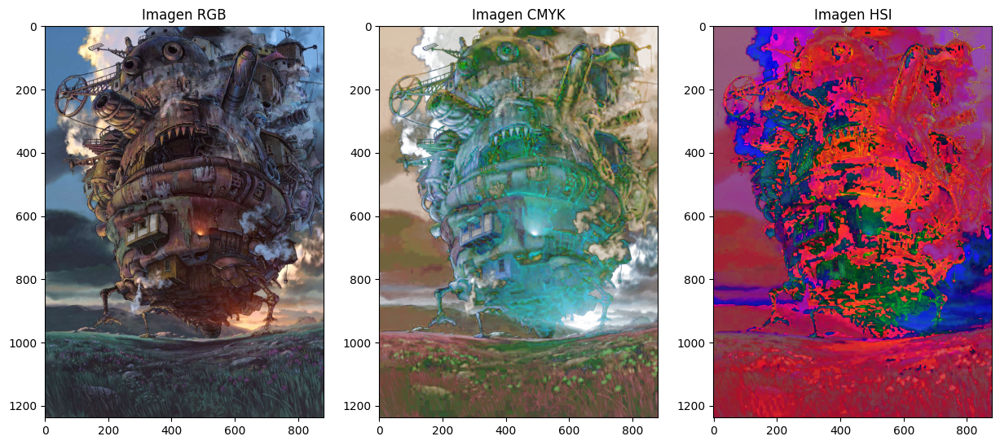

In [478]:

fig, ax = plt.subplots(1,3,figsize=(15,10))

ax[0].set_title('Imagen RGB')
ax[0].imshow(img_ilustracion)
ax[1].set_title('Imagen CMYK')
ax[1].imshow(image_cmyk)
ax[2].set_title('Imagen HSI')
ax[2].imshow(image_hsi)
plt.show()

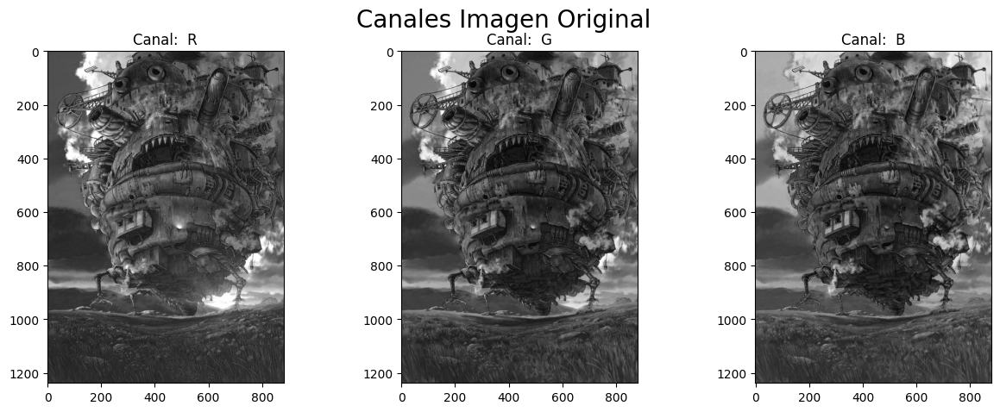

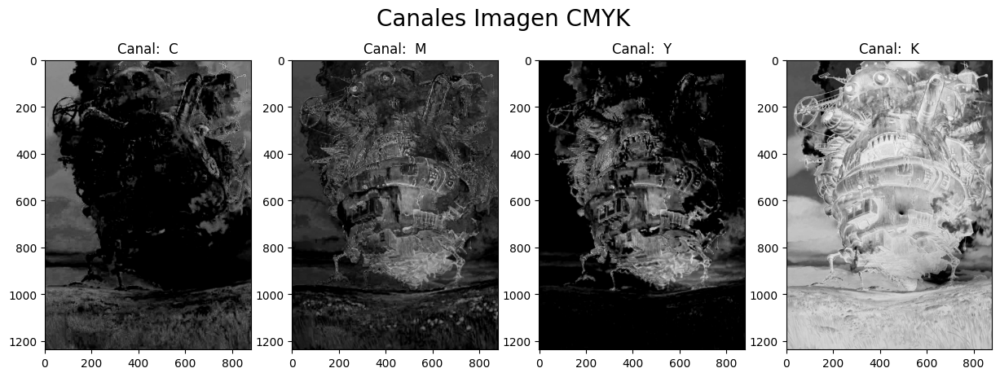

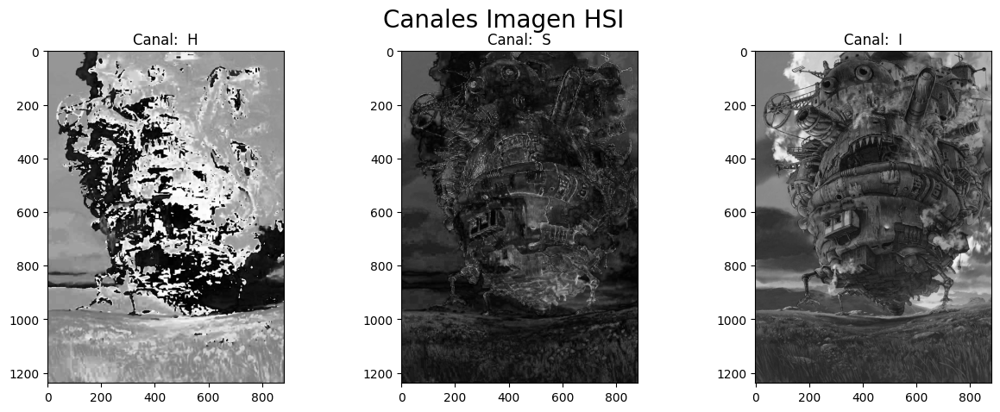

In [479]:
show_channels_image(img_ilustracion,'Canales Imagen Original','R','G','B')
fig, ax = plt.subplots(1,4,figsize= (15,5))

ax[0].imshow(image_cmyk[:,:,0], cmap='gray')
ax[0].set_title(f'Canal:  C')
ax[1].imshow(image_cmyk[:,:,1], cmap='gray')
ax[1].set_title(f'Canal:  M')
ax[2].imshow(image_cmyk[:,:,2], cmap='gray')
ax[2].set_title(f'Canal:  Y')
ax[3].imshow(image_cmyk[:,:,3], cmap='gray')
ax[3].set_title(f'Canal:  K')
# Agregar un título general a la figura
fig.suptitle('Canales Imagen CMYK', fontsize=20)

plt.show()
show_channels_image(image_hsi,'Canales Imagen HSI', 'H','S','I')

In [480]:
print(img_ilustracion.shape)
print(image_cmyk.shape)
print(image_hsi.shape)

(1238, 880, 3)
(1238, 880, 4)
(1238, 880, 3)


## 3. Seleccione un modelo de color y aplique una expansión de contraste y un filtro de intensidad con una función NO monotónica creciente

In [481]:
def non_monotonic_power_filter(channel):
    return np.power(channel / 255, 2) * 255

def non_monotonic_logarithmic_filter(channel):
    # Normalizar los valores de los píxeles al rango [0, 1]
    normalized_channel = channel / 255.0
    
    # Aplicar el filtro logarítmico
    log_channel = np.log(1 + normalized_channel)
    
    # Escalar los valores de vuelta al rango [0, 255] y convertirlos a enteros
    log_channel_scaled = (log_channel / np.max(log_channel) * 255).astype(np.uint8)
    
    return log_channel_scaled

img_rgb_modificada = img_ilustracion.copy()
img_rgb_modificada[:,:,1] = non_monotonic_logarithmic_filter(img_rgb_modificada[:,:,1])
img_rgb_modificada[:,:,2] = non_monotonic_power_filter(img_rgb_modificada[:,:,2])



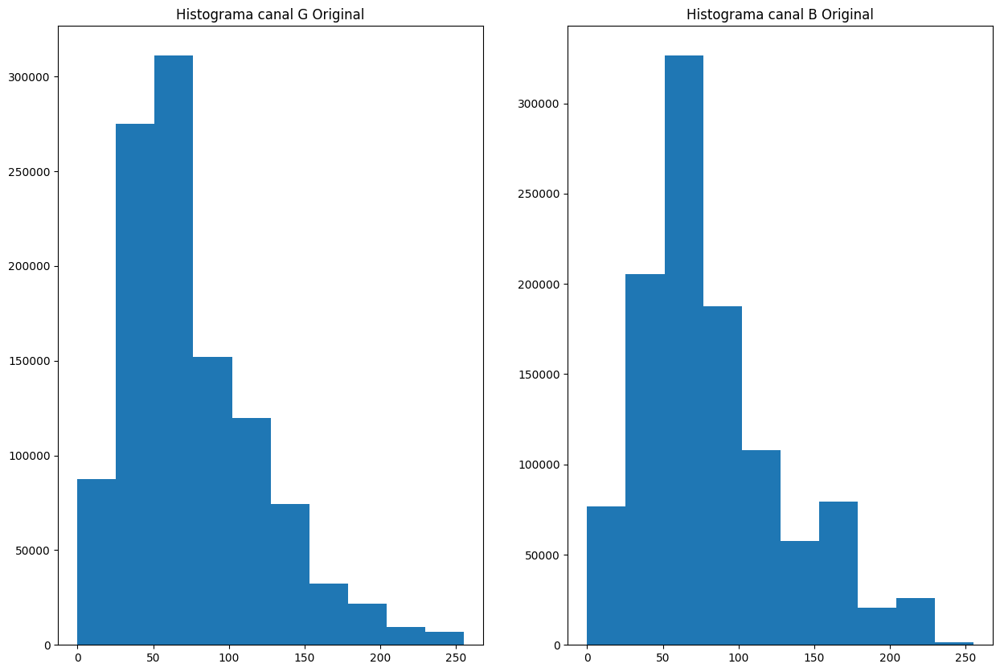

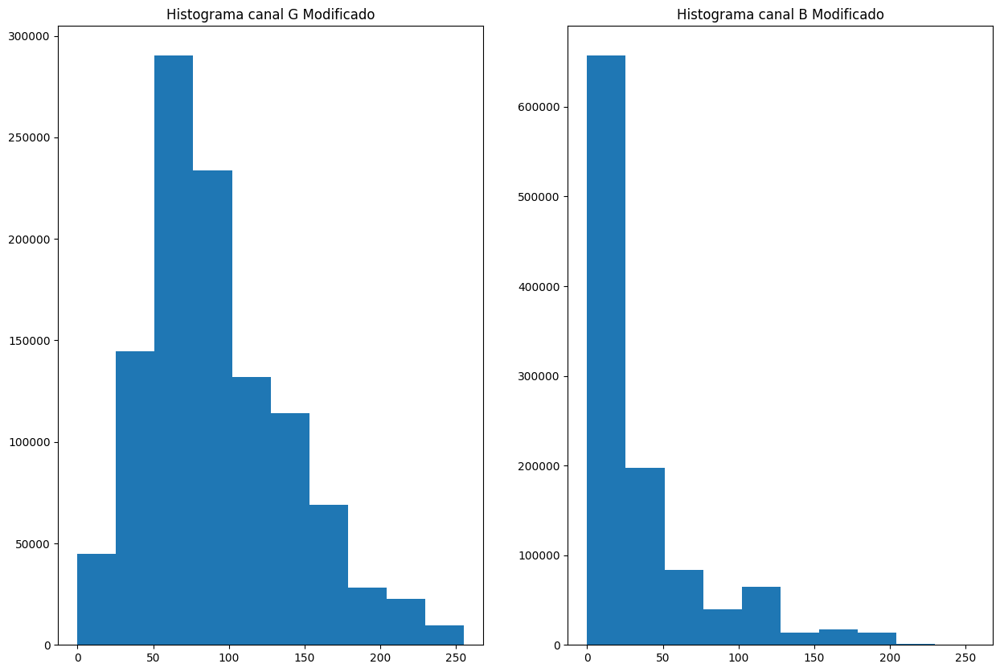

In [482]:

fig, ax = plt.subplots(1,2,figsize=(15,10))

ax[0].set_title('Histograma canal G Original')
ax[0].hist(img_ilustracion[:,:,1].reshape(-1,1))
ax[1].set_title('Histograma canal B Original')
ax[1].hist(img_ilustracion[:,:,2].reshape(-1,1))
plt.show()

fig, ax = plt.subplots(1,2,figsize=(15,10))

ax[0].set_title('Histograma canal G Modificado')
ax[0].hist(img_rgb_modificada[:,:,1].reshape(-1,1))
ax[1].set_title('Histograma canal B Modificado')
ax[1].hist(img_rgb_modificada[:,:,2].reshape(-1,1))
plt.show()

## 4. Visualice los resultados de los canales modificados y explique los resultados asociados a la definición del filtro utilizado

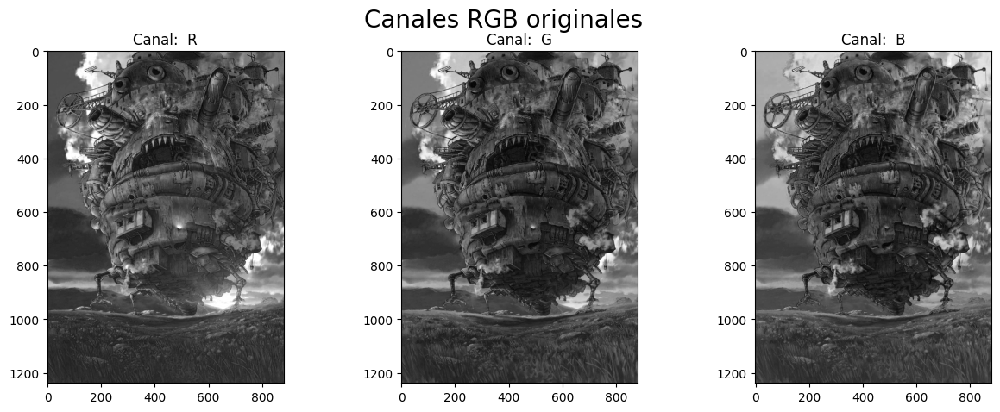

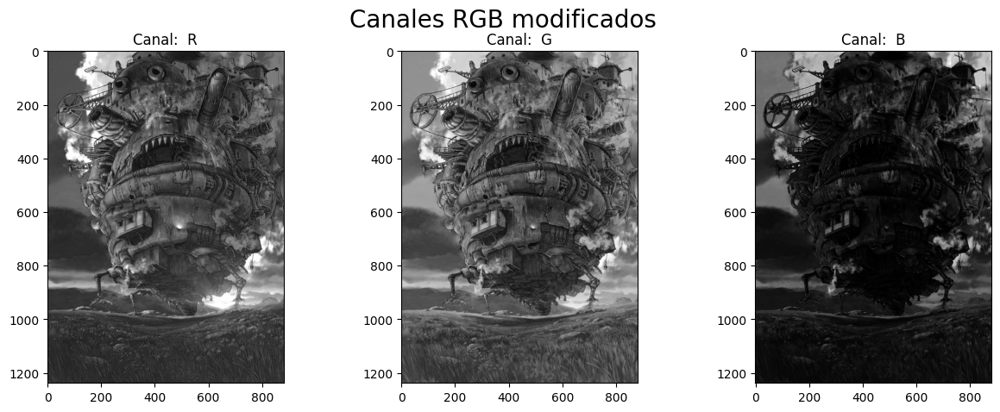

In [485]:
show_channels_image(img_ilustracion,'Canales RGB originales','R','G','B')
show_channels_image(img_rgb_modificada,'Canales RGB modificados','R','G','B')

### ANALISIS DE RESULTADOS:

__Canal Verde:__
- __Filtro Aplicado:__ Filtro logaritmico
- __Definicion del filtro:__ Expande el rango dinamico de los valores de los pixeles mas oscuros.
- __Resultados:__ Al expandir el rango de los pixeles mas oscuros (mejorando su intensidad), mejoro el contraste en el canal verde teniendo una mejor definicion y añadiendo mayor importancia (mejor tono) a este canal.

__Canal Azul:__
- __Filtro Aplicado:__ Filtro de potencia
- __Definicion del filtro:__ Disminuye o aumenta el contraste dependiendo de la distribucion original de los valores de cada pixel
- __Resultados:__ Teniendo en cuenta los resultados del histograma en el canal Azul se logra notar que los valores tienden a 0 (menor intensidad, menor tono) y decrecen cerca a 255 (mayor intensidad, mejor tono). Por esta razon el filtro de potencia hace que se pierda intensidad en el canal Azul.

## 5. Rearme la imagen en color con los canales modificados y describa el resultado.

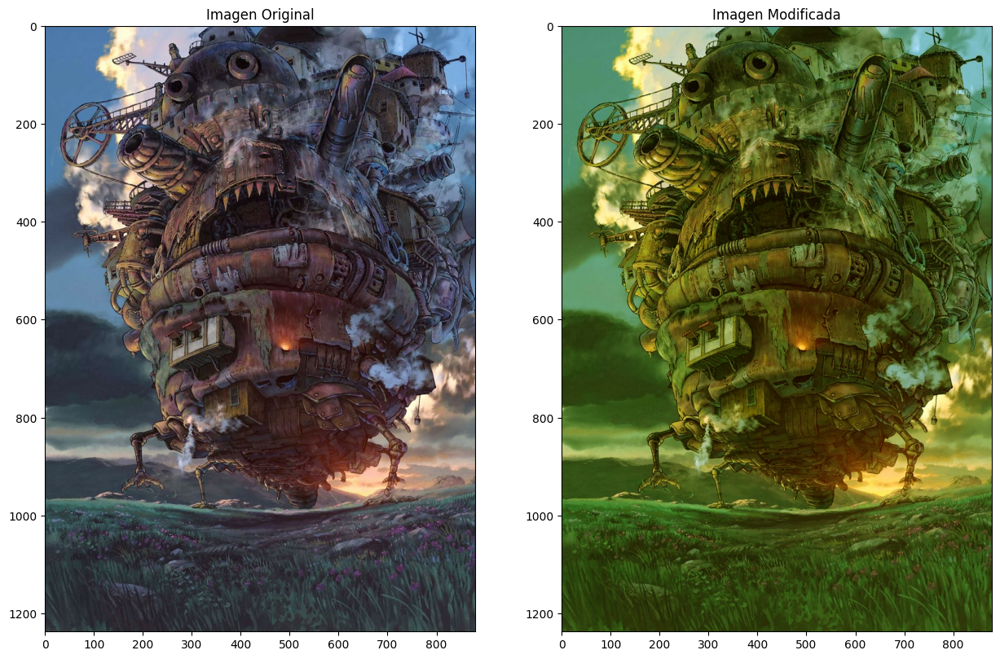

In [484]:
fig, ax = plt.subplots(1,2,figsize=(15,10))

ax[0].set_title('Imagen Original')
ax[0].imshow(img_ilustracion)
ax[1].set_title('Imagen Modificada')
ax[1].imshow(img_rgb_modificada)
plt.show()


- La imagen alterada refleja los resultados mencionados anteriormente, evidenciando una disminución en la intensidad del color azul y un aumento en la intensidad del color verde. 

- Debido a que el canal rojo permaneció sin cambios, su intensidad se mantiene igual y puede ser apreciada solo con un poco de dificultad gracias a la ganancia de intensidad en el canal verde.